Here is an implementation of model which has separate neural networks for the three channels for a particular pixel in the image.

In [0]:
import matplotlib.pyplot as plt
import numpy as np
import os
import matplotlib.image as mpimg
import random
import math

In [0]:
def make_image(output, shape):
    images = np.reshape(output, shape)
    plt.figure()
    plt.imshow(images)

In [0]:
def convert_output_image(img_flattened, img_shape):
  cols = img_flattened.shape[1]
  img = np.full((img_shape[0], img_shape[1], img_shape[2]), None, dtype = "float")
  for i in range(cols):
    row = math.floor(i/img_shape[1])
    col = i % img_shape[1]
    img[row, col, :] = img_flattened[:, i]
  return img

In [0]:
class NeuralNetwork:
    def __init__(self, x, y, num_hidden, epochs, batch_epochs, learning_rate, num_nodes_layers, activation_function, batch_size):
        self.x = x
        self.y = y

        self.n_x = x[0].shape[0] 
        self.n_out = 1

        self.batch_size = batch_size
        self.activation_function = activation_function
        self.learning_rate = learning_rate
        self.epochs = epochs
        self.batch_epochs = batch_epochs
        self.num_layers = num_hidden + 1  # +1 for output layer

        self.num_nodes_layers = num_nodes_layers
        # inserting input and output nodes to the list
        self.num_nodes_layers.insert(0, self.n_x)
        self.num_nodes_layers.append(self.n_out)
        self.num_nodes_layers = [9, 16, 4, 1]
        print(self.num_nodes_layers)
        self.leaky_slope = 0.01
        self.weights = []
        self.bias = []

    # parameters: weight and bias
    # weight[l] : (num_layers * num_layers-1 ) * num_layers : (no. of nodes in layer l * no. of nodes in layer (l-1)) * no. of layers
    # bias[l]: () : ( no. of nodes in layer * 1) * no. of layers
    def initialize_parameters_random(self):
        for l in range(1, self.num_layers + 1):
            self.weights.append(
                np.random.rand(self.num_nodes_layers[l], self.num_nodes_layers[l - 1]))
            self.bias.append(np.full((self.num_nodes_layers[l], 1), 1))

    # Use this when activation function is tanh or sigmoid
    def initialize_parameters_xavier(self):

        for l in range(1, self.num_layers + 1):
            # print("l =", l)
            # print(self.num_nodes_layers[l] , self.num_nodes_layers[l-1])
            self.weights.append(np.random.randn(self.num_nodes_layers[l], self.num_nodes_layers[l - 1]) * np.sqrt(
                1 / self.num_nodes_layers[l - 1]))
            self.bias.append(np.full((self.num_nodes_layers[l], 1), 1))

    # Use this when activation function is ReLU or Leaky ReLu
    def initialize_parameters_he(self):
        for l in range(1, self.num_layers + 1):
            self.weights.append(np.random.randn(self.num_nodes_layers[l], self.num_nodes_layers[l - 1]) * np.sqrt(
                2 / self.num_nodes_layers[l - 1]))
            self.bias.append(np.full((self.num_nodes_layers[l], 1), 1))

    # Activation Functions
    def activation(self, x):
        if self.activation_function == "linear":
            return x
        if self.activation_function == "sigmoid":
            return 1.0 / (1.0 + np.exp(-x))
        elif self.activation_function == "tanh":
            return np.tanh(x)
        elif self.activation_function == "relu":
            a = np.zeros_like(x)
            return np.maximum(a, x)
        elif self.activation_function == "leaky_relu":
            a = self.leaky_slope * x
            return np.maximum(a, x)

    def gradient_activation(self, X):
        if self.activation_function == "linear":
            return np.ones_like(X)
        elif self.activation_function == "sigmoid":
            return self.activation(X) * (1 - self.activation(X))
        elif self.activation_function == "tanh":
            return (1 - np.square(X))
        elif self.activation_function == "relu":
            grad = np.zeros_like(X)
            grad[X > 0] = 1.0
            return grad
        elif self.activation_function == "leaky_relu":
            grad = np.ones_like(X)
            grad[X <= 0] = self.leaky_slope
            return grad

    def forward_propogation(self, x):
        # dim of A vector: (no. of hidden nodes * num_data) *(no. of layers)
        A = []
        Z = []
        A.append(x)
        A_prev = x
        for l in range(0, self.num_layers):
            z = np.matmul(self.weights[l], A_prev)
            a = self.activation(z)
            A_prev = a0
            A.append(a)
            Z.append(z)
        return (A, Z)


    def loss_function(self, y, out):
        return (0.5 * np.sum((y - out) ** 2))

    def back_propogation(self, A, Z, y):

        delta_z = [None for i in range(self.num_layers)]
        delta_weight = [None for i in range(self.num_layers)]

        delta_z[-1] = np.multiply((y - A[-1]), self.gradient_activation(Z[-1]))
        delta_weight[-1] = np.matmul(delta_z[-1], A[-2].T)

        for l in range(self.num_layers - 2, -1, -1):
            delta_z[l] = np.multiply(np.matmul(self.weights[l + 1].T, delta_z[l + 1]), self.gradient_activation(Z[l]) )
            delta_weight[l] = np.matmul( delta_z[l], A[l].T )

        return delta_weight

    def update_weight(self, A, delta_weight):
        # weight = weight + learning_rate * error * input
        m = A[-1].shape[1]
        for l in range(self.num_layers):
            self.weights[l] = self.weights[l] + (self.learning_rate * delta_weight[l])/m

    def predict(self, x_test):
        A,Z = self.forward_propogation(x_test)
        prediction = A[-1]

        return prediction


    def model(self):

        initializing parameters
        if (self.activation_function in ["tanh", "sigmoid"]):
            self.initialize_parameters_random()
        elif (self.activation_function in ["relu", "leaky_relu"]):
            self.initialize_parameters_random()
        else:
        self.initialize_parameters_random()


        for e in range(self.epochs):

            loss = []
            n_images = len(self.x) 
            for j in range(n_images):
                x = self.x[j]
                y = self.y[j]

                A, Z = self.forward_propogation(x)     
                delta_weight = self.back_propogation(A, Z, y)
                self.update_weight(A, delta_weight)

                prediction = self.predict(x)
                loss.append(self.loss_function(prediction, y))

            if e%10 == 0:
                    print("Epoch = ", e)
                    print("loss = ", np.mean(loss))

In [0]:
def image_to_grayscale(input_image):

    r = input_image[:,:,0]
    g = input_image[:,:,1]
    b = image_image[:,:,2]

    grayscale_image = 0.21*r + 0.72*g + 0.07*b
    grayscale_image = np.asarray(grayscale_image)
    return grayscale_image

In [0]:
def image_to_batch(img, window_size = 5, stride = 1):

    gray = image_to_grayscale(img)

    padding = int((window_size - 1)/2)
    padded_img = np.zeros((2 * padding + gray.shape[0], 2 * padding + gray.shape[1]))
    padded_img[padding:-padding,padding:-padding] = gray

    rows = gray.shape[0]
    cols = gray.shape[1]
    input_batch = []
    output_batch = [[] for i in range(3)]
    for i in range(0,rows,stride):
        for j in range(0,cols,stride):
            window = padded_img[i:i+window_size,j:j+window_size]
            input_batch.append(window.flatten())
            for k in range(3):
                output_batch[k].append(img[i,j,k])
    input_batch = np.asarray(input_batch).T

    return input_batch, [np.array(output_batch[0]).T, np.array(output_batch[1]).T, np.array(output_batch[2]).T]

In [0]:
def split_data(images, window_size = 5, stride = 1):

    train_data = []
    train_output = [[] for i in range(3)]
    test_data = []
    test_output = [[] for i in range(3)]

    for img in images:
        input_batch, output_batch = image_to_batch(img, window_size, stride)

        choice = random.random()
        if choice < 0.85:
            train_data.append(input_batch)
            for k in range(3):
                train_output[k].append(output_batch[k])
#         else:
            test_data.append(input_batch)
            for k in range(3):
                test_output[k].append(output_batch[k])

    return (train_data, train_output), (test_data, test_output)

In [0]:
def get_data(directory_in_str):
    images = []
    directory = os.fsencode(directory_in_str)
    count = 1

    for file in os.listdir(directory):
        path = os.path.join(directory, file)
        filename = os.fsdecode(path)

        img = mpimg.imread(filename)
        images.append(np.asarray(img))
        count+=1

    return images

[9, 16, 4, 1]
[9, 16, 4, 1]
[9, 16, 4, 1]
Epoch =  0
loss =  1820.364777706249
Epoch =  10
loss =  1774.441658302267
Epoch =  20
loss =  1773.8953323897397
Epoch =  30
loss =  1773.11795034698
Epoch =  40
loss =  1771.8427813254716
Epoch =  50
loss =  1769.3003275674118
Epoch =  60
loss =  1761.8904668382497
Epoch =  70
loss =  1703.0172099714166
Epoch =  80
loss =  1584.3713613301702
Epoch =  90
loss =  1443.3565368427346
Epoch =  0
loss =  1629.8736019039097
Epoch =  10
loss =  1407.3509004979855
Epoch =  20
loss =  1289.7409869767891
Epoch =  30
loss =  1132.4203632579845
Epoch =  40
loss =  872.9404318220667
Epoch =  50
loss =  429.07684927660404
Epoch =  60
loss =  243.87539214098038
Epoch =  70
loss =  210.61448928941218
Epoch =  80
loss =  198.84061641263452
Epoch =  90
loss =  191.44445518361994
Epoch =  0
loss =  2477.2706373136275
Epoch =  10
loss =  1927.1562834165334
Epoch =  20
loss =  1870.116709079502
Epoch =  30
loss =  1743.8448248424781
Epoch =  40
loss =  1527.847620

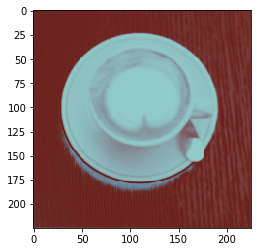

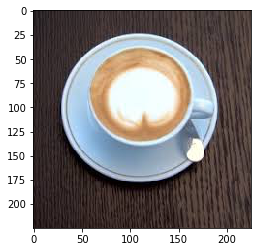

(9, 50625)
[[0.50623519 0.53988696 0.53988696 ... 0.52621831 0.52642872 0.49444013]
 [0.56855025 0.73208895 0.73208895 ... 0.69521321 0.69602746 0.54380185]
 [0.57766772 0.73658527 0.73658527 ... 0.68055148 0.68129758 0.48185588]]
[[1.         1.         1.         ... 0.95294118 0.95294118 0.95686275]
 [1.         1.         1.         ... 0.95294118 0.95294118 0.95686275]
 [1.         1.         1.         ... 0.95294118 0.95294118 0.95686275]]


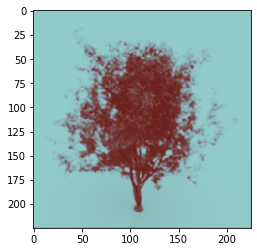

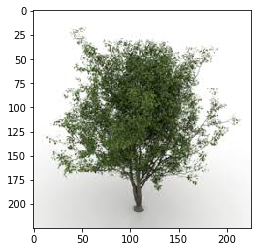

(9, 50625)
[[0.50557618 0.5392849  0.5392849  ... 0.45472356 0.4479934  0.43427397]
 [0.56439659 0.72979168 0.72979168 ... 0.27604314 0.25404531 0.21649579]
 [0.57321471 0.73477519 0.73477519 ... 0.22636035 0.20925037 0.15516867]]
[[0.98039216 0.98039216 0.98039216 ... 0.44705882 0.49411765 0.49019608]
 [0.99607843 0.99607843 0.99607843 ... 0.41176471 0.44313725 0.41568627]
 [1.         1.         1.         ... 0.10196078 0.16862745 0.24705882]]


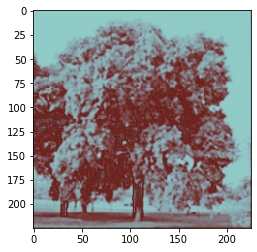

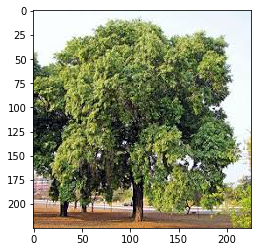

(9, 50625)
[[0.44243492 0.47321986 0.48471801 ... 0.44387037 0.4450276  0.43597219]
 [0.20918251 0.32956737 0.4162879  ... 0.25402678 0.27357331 0.22731387]
 [0.16623824 0.30456234 0.41324348 ... 0.2035309  0.22263995 0.153516  ]]
[[0.40784314 0.43921569 0.52156863 ... 0.45882353 0.55686275 0.42352941]
 [0.45490196 0.48627451 0.56862745 ... 0.45882353 0.55686275 0.42352941]
 [0.4        0.43921569 0.52156863 ... 0.25490196 0.35294118 0.21960784]]


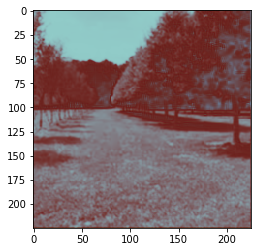

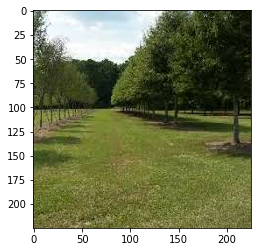

(9, 50625)
[[0.45012517 0.47785784 0.48307508 ... 0.51052365 0.50953642 0.47833521]
 [0.24802923 0.37769078 0.39724975 ... 0.62480762 0.61764839 0.4398032 ]
 [0.20795229 0.35557196 0.38986065 ... 0.60645491 0.59968072 0.3643202 ]]
[[0.60784314 0.58039216 0.59607843 ... 0.88627451 0.87058824 0.84705882]
 [0.58431373 0.54901961 0.56470588 ... 0.81960784 0.80392157 0.78039216]
 [0.28627451 0.25490196 0.27843137 ... 0.75686275 0.74117647 0.70980392]]


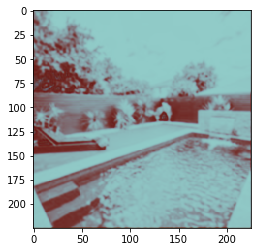

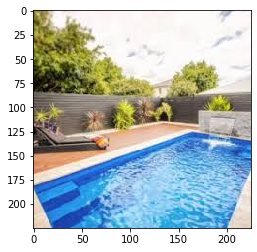

(9, 50625)
[[0.50327112 0.53801111 0.5385015  ... 0.44608807 0.45142257 0.44067456]
 [0.55407647 0.72421012 0.7260519  ... 0.23901355 0.29391103 0.26833375]
 [0.56033033 0.72980514 0.73200872 ... 0.1945772  0.24443165 0.1967909 ]]
[[0.95686275 0.9372549  0.94117647 ... 0.33333333 0.4745098  0.56470588]
 [1.         0.98039216 0.98431373 ... 0.37254902 0.51372549 0.60392157]
 [0.97647059 0.95686275 0.96078431 ... 0.41960784 0.56078431 0.65098039]]


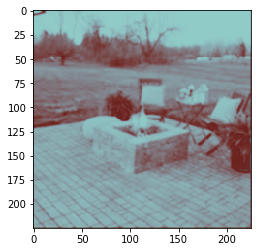

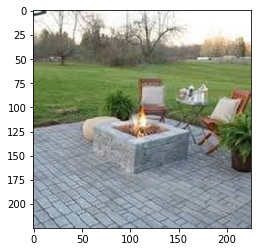

(9, 50625)
[[0.43147396 0.44138713 0.43258455 ... 0.41933947 0.41740243 0.42028637]
 [0.21332017 0.17968013 0.17843508 ... 0.16851359 0.16855959 0.23289801]
 [0.18223004 0.14500278 0.15105486 ... 0.12273962 0.13160885 0.16897917]]
[[0.28627451 0.18823529 0.27058824 ... 0.28235294 0.35294118 0.32156863]
 [0.34901961 0.25098039 0.33333333 ... 0.24313725 0.30196078 0.27058824]
 [0.19607843 0.09803922 0.18823529 ... 0.20784314 0.27058824 0.19607843]]


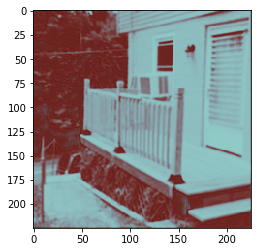

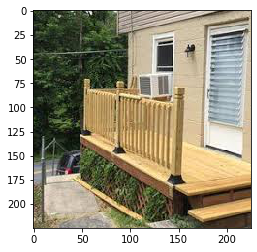

(9, 50625)
[[0.49538993 0.52914791 0.52914633 ... 0.47392064 0.47278396 0.45050368]
 [0.49340539 0.68541717 0.68552329 ... 0.41434712 0.40546111 0.28365944]
 [0.49544267 0.69883937 0.698807   ... 0.36999192 0.36211465 0.20903239]]
[[0.86666667 0.86666667 0.86666667 ... 0.54117647 0.53333333 0.51372549]
 [0.8745098  0.8745098  0.8745098  ... 0.61568627 0.60784314 0.58431373]
 [0.95686275 0.95686275 0.95686275 ... 0.63137255 0.62352941 0.6       ]]


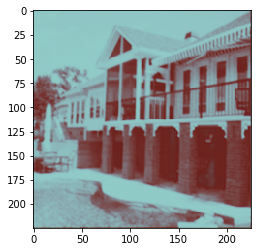

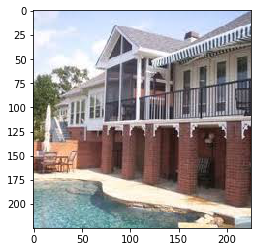

(9, 50625)
[[0.44789009 0.47464588 0.47402089 ... 0.41139513 0.40672932 0.41284302]
 [0.27156854 0.40739222 0.4025021  ... 0.33365767 0.34077318 0.44344527]
 [0.22717955 0.37264668 0.36709103 ... 0.31269238 0.36506127 0.49336879]]
[[0.70196078 0.69411765 0.68627451 ... 0.07843137 0.05098039 0.05098039]
 [0.65490196 0.64705882 0.63921569 ... 0.09411765 0.06666667 0.05882353]
 [0.55294118 0.54509804 0.5372549  ... 0.03529412 0.00784314 0.00784314]]


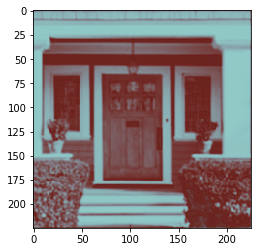

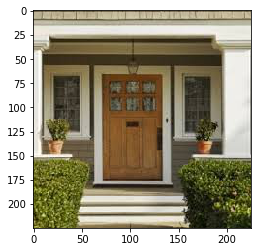

(9, 50625)
[[0.45438129 0.49424155 0.49770519 ... 0.46001805 0.45516943 0.4318364 ]
 [0.25602456 0.47197035 0.48607374 ... 0.33143256 0.32314939 0.25779653]
 [0.20139727 0.48280537 0.5048193  ... 0.27608369 0.24921574 0.17389848]]
[[0.35294118 0.5254902  0.34117647 ... 0.48627451 0.5254902  0.52156863]
 [0.52156863 0.74509804 0.62745098 ... 0.5254902  0.56470588 0.54901961]
 [0.54901961 0.85098039 0.84313725 ... 0.57254902 0.61176471 0.57254902]]


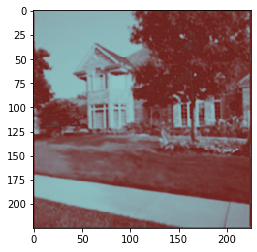

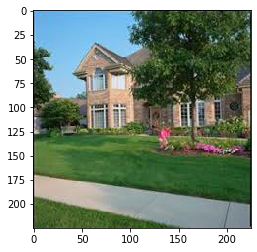

(9, 50625)
[[0.43493251 0.44876151 0.45159822 ... 0.41489452 0.41450815 0.41871665]
 [0.19839621 0.20713652 0.21519733 ... 0.17943223 0.18273215 0.26974146]
 [0.1632958  0.17318533 0.18317844 ... 0.13527092 0.13716267 0.19868858]]
[[0.34901961 0.36862745 0.38039216 ... 0.32156863 0.34509804 0.28627451]
 [0.32941176 0.3372549  0.34901961 ... 0.2745098  0.29803922 0.25882353]
 [0.31764706 0.32941176 0.34117647 ... 0.22745098 0.24313725 0.18431373]]


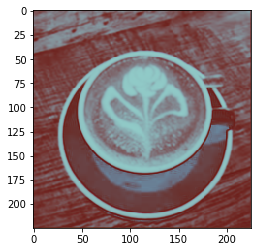

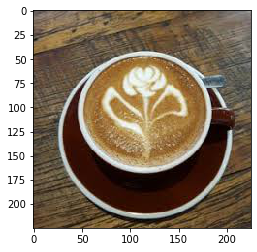

(9, 50625)
[[0.50242982 0.53644858 0.53670841 ... 0.45007794 0.45042454 0.43666154]
 [0.54420429 0.71864991 0.71969943 ... 0.27520721 0.27878417 0.24185467]
 [0.55128844 0.72580982 0.72665063 ... 0.22450823 0.22649947 0.17508664]]
[[0.95686275 0.95686275 0.96078431 ... 0.55294118 0.55294118 0.60392157]
 [0.96078431 0.96078431 0.96470588 ... 0.44313725 0.43921569 0.49411765]
 [0.96862745 0.96862745 0.97254902 ... 0.4        0.40784314 0.45098039]]


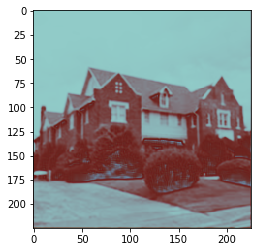

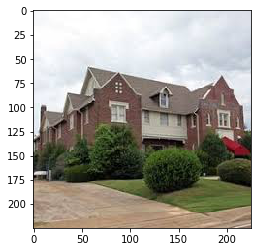

(9, 50625)
[[0.46174987 0.4884748  0.48832051 ... 0.42107474 0.42010198 0.42004434]
 [0.2781524  0.43814455 0.4364423  ... 0.16864545 0.15798295 0.21437282]
 [0.24462471 0.444242   0.44200367 ... 0.13122887 0.12138359 0.16416442]]
[[0.41568627 0.41568627 0.41176471 ... 0.26666667 0.2        0.23921569]
 [0.60784314 0.60784314 0.60392157 ... 0.31764706 0.24705882 0.27058824]
 [0.87843137 0.87843137 0.8745098  ... 0.45490196 0.39607843 0.42352941]]


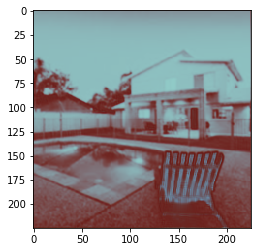

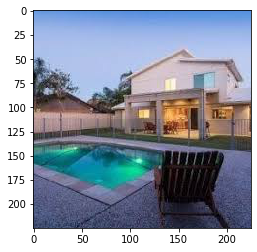

(9, 50625)
[[0.42174837 0.42559121 0.42792886 ... 0.51375061 0.51496958 0.48485235]
 [0.28185716 0.19237408 0.2100118  ... 0.63357071 0.64001908 0.48104149]
 [0.27599131 0.15942187 0.17966623 ... 0.61895639 0.62612538 0.41309783]]
[[0.17254902 0.18039216 0.21176471 ... 0.81960784 0.82745098 0.86666667]
 [0.17254902 0.18039216 0.21176471 ... 0.80784314 0.81568627 0.85490196]
 [0.1254902  0.13333333 0.16470588 ... 0.83529412 0.84313725 0.88235294]]


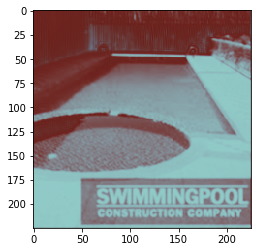

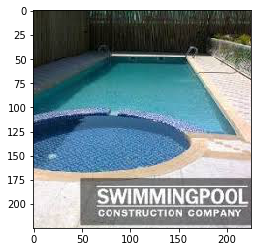

(9, 50625)
[[0.46239415 0.4897353  0.4897353  ... 0.49736229 0.49740842 0.46854506]
 [0.28238058 0.44721327 0.44721327 ... 0.5607368  0.56153587 0.39372696]
 [0.24901308 0.45434517 0.45434517 ... 0.53282657 0.53400559 0.31419731]]
[[0.39607843 0.39607843 0.39607843 ... 0.8        0.79607843 0.79215686]
 [0.62745098 0.62745098 0.62745098 ... 0.76078431 0.75686275 0.75294118]
 [0.84705882 0.84705882 0.84705882 ... 0.72156863 0.71764706 0.71372549]]


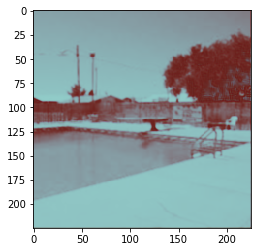

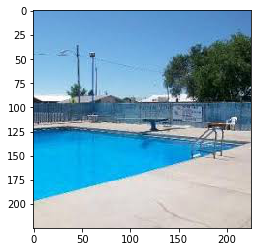

(9, 50625)
[[0.49838749 0.53252206 0.53252206 ... 0.5181884  0.51692865 0.48502694]
 [0.51894371 0.70260628 0.70260628 ... 0.66206261 0.65747315 0.48816067]
 [0.52290024 0.71251535 0.71251535 ... 0.64475079 0.64101568 0.41700843]]
[[0.95294118 0.95294118 0.95294118 ... 0.94901961 0.94509804 0.91764706]
 [0.92156863 0.92156863 0.92156863 ... 0.88235294 0.87843137 0.86666667]
 [0.87843137 0.87843137 0.87843137 ... 0.81176471 0.80784314 0.8       ]]


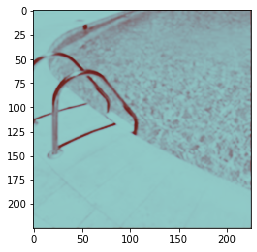

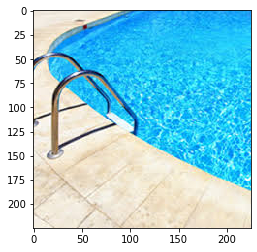

(9, 50625)
[[0.44436079 0.46222888 0.46222888 ... 0.49800245 0.49691452 0.4666292 ]
 [0.2100259  0.26971461 0.26971461 ... 0.55609648 0.54547362 0.37540357]
 [0.17312429 0.24383025 0.24383025 ... 0.5315736  0.51785803 0.29938109]]
[[0.19607843 0.19607843 0.19607843 ... 0.87058824 0.83137255 0.84705882]
 [0.4627451  0.4627451  0.4627451  ... 0.71372549 0.67843137 0.70588235]
 [0.79607843 0.79607843 0.79607843 ... 0.61176471 0.56470588 0.61960784]]


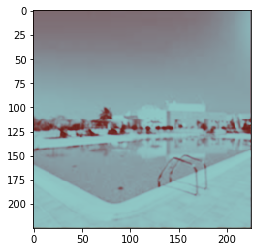

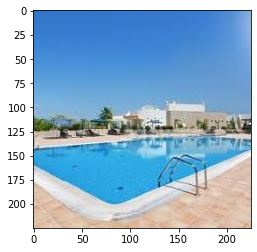

(9, 50625)
[[0.46154583 0.46638109 0.43532505 ... 0.45304621 0.4530242  0.43806304]
 [0.25503124 0.27564192 0.1651926  ... 0.29451719 0.29414746 0.24019617]
 [0.22774014 0.28071448 0.13735767 ... 0.24289833 0.24217354 0.17164087]]
[[0.58039216 0.54117647 0.23921569 ... 0.02745098 0.03137255 0.02745098]
 [0.52156863 0.48235294 0.18431373 ... 0.59607843 0.59215686 0.59607843]
 [0.49411765 0.4627451  0.17254902 ... 0.81176471 0.81176471 0.81960784]]


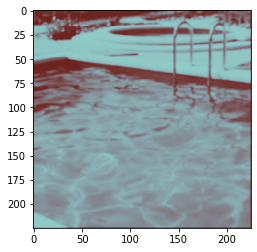

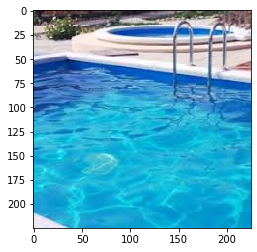

(9, 50625)
[[0.43423855 0.44545105 0.44583288 ... 0.49993887 0.4999087  0.47050815]
 [0.20153263 0.19838383 0.19915017 ... 0.56852731 0.56839891 0.39848342]
 [0.1674414  0.16441167 0.16505419 ... 0.54447865 0.54421232 0.32092273]]
[[0.43921569 0.44313725 0.44313725 ... 0.75686275 0.75686275 0.75686275]
 [0.30588235 0.30980392 0.30980392 ... 0.75294118 0.75294118 0.75294118]
 [0.19607843 0.2        0.2        ... 0.74509804 0.74509804 0.74509804]]


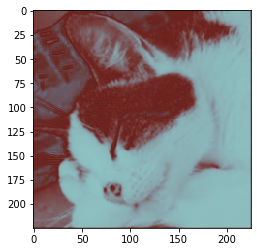

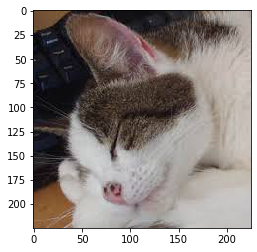

(9, 50625)
[[0.49120563 0.52510784 0.5252239  ... 0.47762781 0.4771551  0.45336033]
 [0.46850039 0.66728075 0.66794184 ... 0.43415112 0.43172033 0.30092134]
 [0.46563234 0.68241854 0.68289011 ... 0.39341434 0.39064764 0.22526552]]
[[0.85098039 0.85098039 0.85098039 ... 0.61568627 0.61568627 0.61176471]
 [0.85098039 0.85098039 0.85098039 ... 0.61568627 0.61568627 0.61176471]
 [0.85098039 0.85098039 0.85098039 ... 0.58431373 0.58431373 0.58039216]]


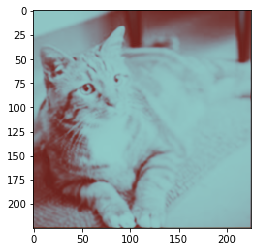

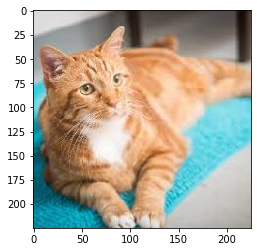

(9, 50625)
[[0.42547449 0.43162964 0.43297481 ... 0.41851784 0.41762646 0.41933028]
 [0.23615951 0.18010644 0.17910531 ... 0.16715904 0.16468045 0.23506115]
 [0.21272134 0.14514107 0.14412099 ... 0.12700216 0.12596316 0.17647749]]
[[0.23921569 0.24705882 0.25490196 ... 0.27843137 0.27058824 0.2745098 ]
 [0.22745098 0.23529412 0.24313725 ... 0.28627451 0.27843137 0.28235294]
 [0.15294118 0.16078431 0.16862745 ... 0.24313725 0.23529412 0.23137255]]


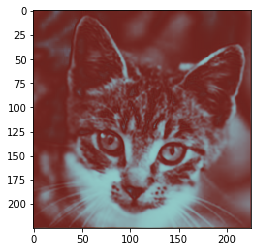

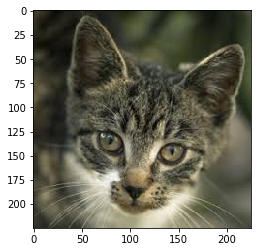

(9, 50625)
[[0.48185119 0.5155709  0.51520178 ... 0.43825795 0.43327317 0.42086242]
 [0.42167374 0.62621398 0.6242108  ... 0.19298686 0.17876749 0.1762316 ]
 [0.40673534 0.64059964 0.6385319  ... 0.16401907 0.14072111 0.12863477]]
[[0.87843137 0.87843137 0.8745098  ... 0.40392157 0.38039216 0.22352941]
 [0.81176471 0.81176471 0.80784314 ... 0.3254902  0.30196078 0.17254902]
 [0.69411765 0.70196078 0.69803922 ... 0.23137255 0.20784314 0.10980392]]


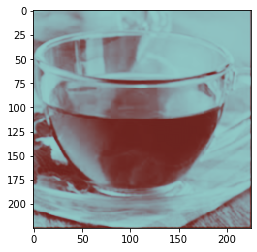

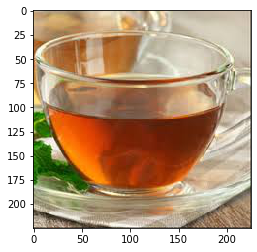

(9, 50625)
[[0.45893222 0.49080277 0.49370249 ... 0.4823758  0.48495691 0.46111221]
 [0.27165291 0.42478946 0.43574817 ... 0.45569778 0.48177056 0.34991612]
 [0.23286439 0.42889949 0.45516931 ... 0.42020946 0.44862573 0.27364434]]
[[0.59607843 0.54509804 0.48627451 ... 0.64705882 0.69803922 0.74117647]
 [0.58431373 0.53333333 0.4745098  ... 0.59607843 0.64705882 0.69411765]
 [0.65098039 0.6        0.54117647 ... 0.63137255 0.68235294 0.73333333]]


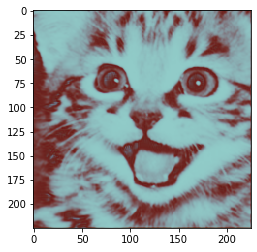

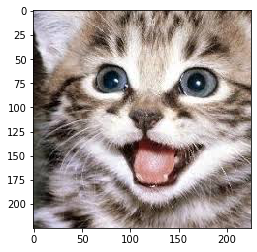

(9, 50625)
[[0.42479023 0.42948095 0.42952523 ... 0.41518784 0.41536104 0.41799134]
 [0.24801388 0.18444472 0.18357027 ... 0.16225604 0.16282301 0.24246314]
 [0.22863177 0.15063037 0.14964244 ... 0.1257044  0.12589135 0.1866685 ]]
[[0.21176471 0.21176471 0.21176471 ... 0.25098039 0.25098039 0.25098039]
 [0.21176471 0.21176471 0.21176471 ... 0.25098039 0.25098039 0.25098039]
 [0.21176471 0.21176471 0.21176471 ... 0.25098039 0.25098039 0.25098039]]


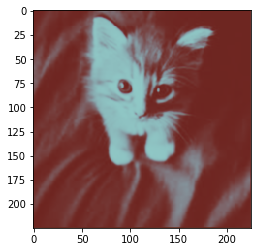

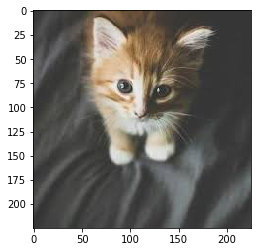

(9, 50625)
[[0.43912597 0.45355062 0.4536869  ... 0.43796333 0.43213878 0.42396043]
 [0.20143313 0.22748003 0.22811971 ... 0.20828257 0.18333717 0.19495576]
 [0.16558173 0.1960262  0.19654292 ... 0.16573014 0.14320954 0.14279586]]
[[0.5254902  0.5254902  0.5254902  ... 0.4745098  0.41960784 0.39607843]
 [0.34901961 0.34901961 0.34901961 ... 0.34509804 0.29019608 0.2627451 ]
 [0.23529412 0.23529412 0.23529412 ... 0.30980392 0.25490196 0.22745098]]


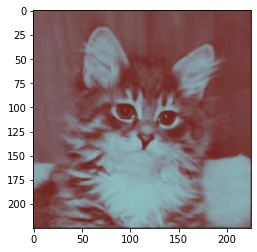

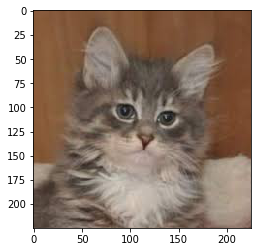

(9, 50625)
[[0.50292479 0.53709142 0.53719825 ... 0.50367857 0.50328608 0.4731448 ]
 [0.55187584 0.72282369 0.7230266  ... 0.58930917 0.58735208 0.41437686]
 [0.55859083 0.7285881  0.72882762 ... 0.56730211 0.56505099 0.33726812]]
[[0.97254902 0.97254902 0.97254902 ... 0.88235294 0.88235294 0.86666667]
 [0.98431373 0.98431373 0.98431373 ... 0.76078431 0.76078431 0.75686275]
 [1.         1.         1.         ... 0.65098039 0.65098039 0.6627451 ]]


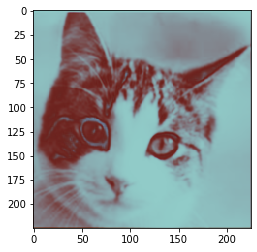

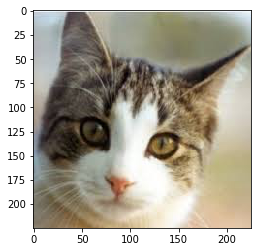

(9, 50625)
[[0.43797282 0.44793594 0.44343658 ... 0.40827337 0.40755052 0.41263856]
 [0.20953187 0.21128569 0.19679768 ... 0.27745169 0.25428619 0.3733828 ]
 [0.17507416 0.17623826 0.16026474 ... 0.25339214 0.24350784 0.38743715]]
[[0.50980392 0.46666667 0.43921569 ... 0.05882353 0.03921569 0.1372549 ]
 [0.38823529 0.34509804 0.30980392 ... 0.10980392 0.09803922 0.20392157]
 [0.17647059 0.13333333 0.09803922 ... 0.         0.         0.12941176]]


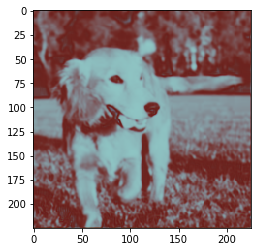

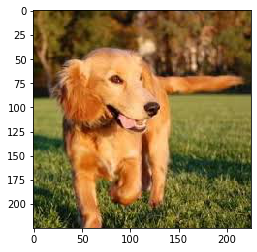

(9, 50625)
[[0.46597442 0.49507873 0.4938866  ... 0.44656607 0.44642361 0.43421656]
 [0.30327053 0.48582994 0.47850522 ... 0.26222636 0.26189971 0.22995224]
 [0.27088816 0.49922667 0.49058334 ... 0.21082356 0.21013069 0.16287361]]
[[0.45490196 0.47843137 0.4627451  ... 0.41568627 0.40784314 0.41960784]
 [0.67058824 0.69803922 0.67843137 ... 0.45882353 0.4627451  0.45882353]
 [0.58823529 0.6        0.55686275 ... 0.56862745 0.56862745 0.56470588]]


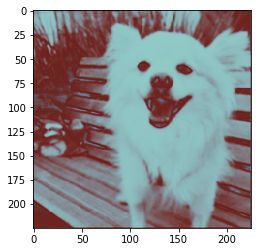

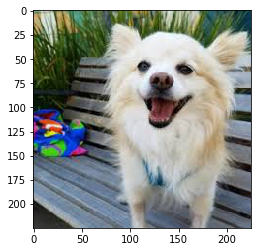

(9, 50625)
[[0.4499312  0.46528861 0.46366598 ... 0.41706392 0.41602161 0.41918431]
 [0.22753037 0.28613281 0.27887002 ... 0.16533124 0.16318339 0.23757218]
 [0.1942358  0.26425872 0.25255131 ... 0.1238388  0.12540018 0.18109369]]
[[0.54117647 0.4745098  0.48235294 ... 0.25882353 0.25882353 0.30196078]
 [0.48627451 0.41960784 0.42745098 ... 0.25882353 0.25882353 0.29803922]
 [0.45098039 0.38431373 0.39215686 ... 0.26666667 0.26666667 0.29019608]]


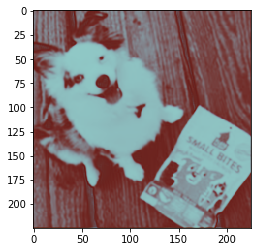

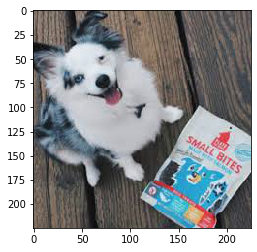

(9, 50625)
[[0.41545863 0.41202646 0.41684368 ... 0.4310571  0.42752546 0.42213869]
 [0.5203637  0.46571477 0.48681104 ... 0.19481396 0.16977647 0.20811879]
 [0.60358908 0.54772764 0.54945082 ... 0.14589749 0.1293056  0.15945887]]
[[0.         0.         0.         ... 0.45490196 0.37254902 0.43921569]
 [0.01960784 0.05490196 0.01568627 ... 0.32156863 0.23921569 0.3372549 ]
 [0.0627451  0.09019608 0.02745098 ... 0.21176471 0.13333333 0.23921569]]


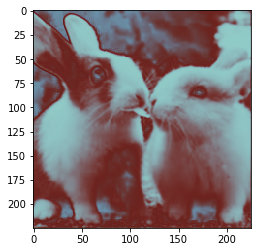

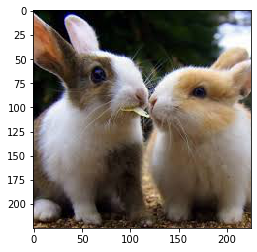

(9, 50625)
[[0.50137089 0.53574545 0.53591776 ... 0.4229884  0.42090347 0.42099338]
 [0.54360102 0.71825613 0.71872773 ... 0.16772971 0.15688673 0.20477292]
 [0.54899302 0.72462927 0.72503974 ... 0.12958719 0.12373745 0.15428598]]
[[0.96862745 0.97254902 0.97254902 ... 0.30588235 0.2745098  0.27058824]
 [0.97254902 0.97647059 0.97647059 ... 0.29803922 0.26666667 0.25882353]
 [0.98039216 0.98431373 0.98431373 ... 0.23921569 0.20784314 0.19215686]]


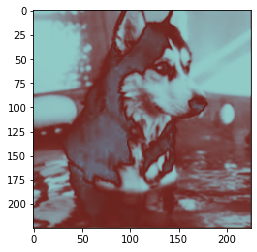

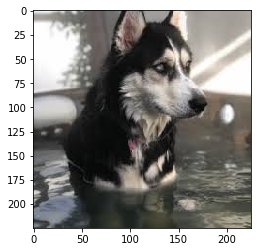

(9, 50625)
[[0.43194297 0.4414097  0.44153638 ... 0.42680166 0.4264404  0.42376779]
 [0.20598964 0.18725555 0.1879991  ... 0.18130496 0.18055926 0.21530133]
 [0.17351554 0.1530226  0.15366768 ... 0.13965377 0.13923653 0.15507479]]
[[0.21176471 0.21176471 0.21568627 ... 0.2        0.2        0.18823529]
 [0.31764706 0.31764706 0.32156863 ... 0.36078431 0.36078431 0.36078431]
 [0.38431373 0.38431373 0.38823529 ... 0.47058824 0.47058824 0.46666667]]


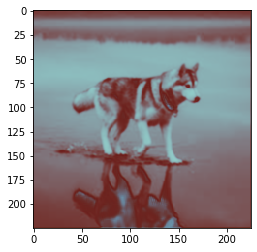

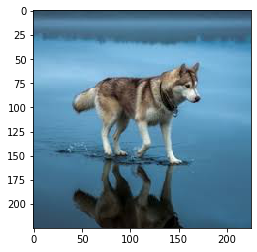

(9, 50625)
[[0.50623519 0.53988696 0.53988696 ... 0.53111507 0.53111507 0.49915956]
 [0.56855025 0.73208895 0.73208895 ... 0.71435719 0.71435719 0.57097609]
 [0.57766772 0.73658527 0.73658527 ... 0.69955692 0.69955692 0.51322988]]
[[1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]]


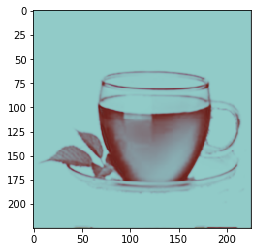

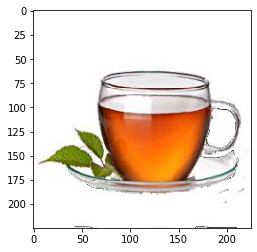

(9, 50625)
[[0.47503864 0.50636281 0.50654463 ... 0.41163952 0.41110495 0.41550119]
 [0.35684592 0.56007723 0.5619115  ... 0.19052027 0.18212221 0.29341294]
 [0.33477452 0.5793733  0.58074846 ... 0.14855229 0.14056333 0.24884565]]
[[0.78039216 0.78431373 0.78823529 ... 0.14901961 0.10980392 0.12156863]
 [0.67843137 0.68235294 0.68627451 ... 0.24705882 0.20784314 0.22352941]
 [0.68235294 0.68627451 0.69019608 ... 0.36862745 0.32941176 0.35294118]]


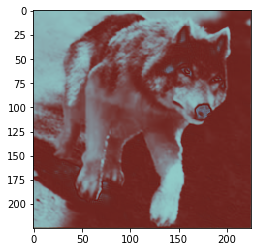

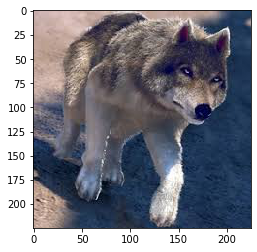

(9, 50625)
[[0.42839961 0.43473265 0.43473265 ... 0.41221319 0.41244318 0.41421011]
 [0.22144393 0.17525486 0.17525486 ... 0.39528319 0.38951252 0.49393377]
 [0.1942323  0.14336734 0.14336734 ... 0.3810897  0.36934632 0.50081094]]
[[0.3372549  0.3372549  0.3372549  ... 0.15294118 0.15686275 0.16862745]
 [0.21568627 0.21568627 0.21568627 ... 0.15294118 0.15686275 0.16862745]
 [0.20392157 0.20392157 0.20392157 ... 0.15294118 0.15686275 0.16862745]]


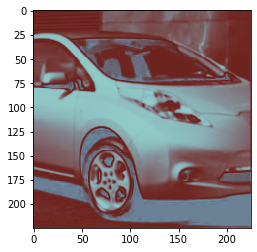

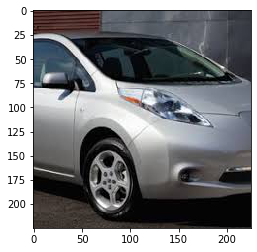

(9, 50625)
[[0.50090839 0.53490356 0.53490356 ... 0.52527781 0.52527781 0.49326264]
 [0.53424238 0.71221509 0.71221509 ... 0.69159634 0.69159634 0.53681475]
 [0.5403094  0.72065738 0.72065738 ... 0.67673727 0.67673727 0.47360767]]
[[0.94509804 0.94509804 0.94509804 ... 0.94509804 0.94509804 0.94509804]
 [0.94509804 0.94509804 0.94509804 ... 0.94509804 0.94509804 0.94509804]
 [0.94509804 0.94509804 0.94509804 ... 0.94509804 0.94509804 0.94509804]]


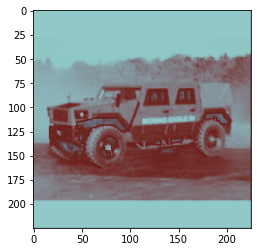

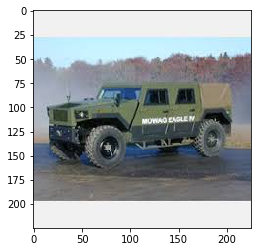

(9, 50625)
[[0.49283949 0.52664823 0.52668631 ... 0.45715889 0.45935903 0.44317426]
 [0.47676827 0.67423901 0.67471946 ... 0.31122724 0.33124528 0.25807784]
 [0.47598871 0.68898966 0.68925901 ... 0.26251248 0.28258647 0.18606329]]
[[0.85490196 0.85882353 0.8627451  ... 0.57647059 0.62352941 0.60784314]
 [0.85882353 0.8627451  0.86666667 ... 0.4745098  0.52156863 0.51764706]
 [0.82745098 0.83921569 0.84313725 ... 0.42352941 0.47058824 0.45490196]]


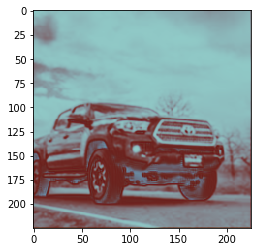

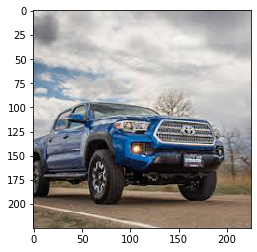

(9, 50625)
[[0.50090839 0.53490356 0.53490356 ... 0.44476795 0.45206483 0.44058582]
 [0.53424238 0.71221509 0.71221509 ... 0.25125624 0.29203204 0.25041563]
 [0.5403094  0.72065738 0.72065738 ... 0.20605218 0.24446308 0.18140354]]
[[0.94509804 0.94509804 0.94509804 ... 0.33333333 0.38823529 0.43137255]
 [0.94509804 0.94509804 0.94509804 ... 0.49411765 0.54901961 0.57254902]
 [0.94509804 0.94509804 0.94509804 ... 0.23529412 0.28235294 0.29803922]]


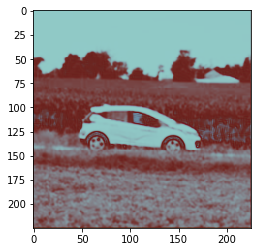

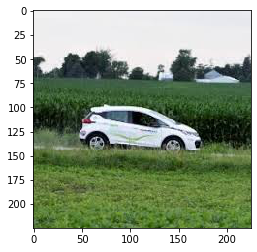

(9, 50625)
[[0.46974359 0.49973354 0.49973354 ... 0.4340074  0.43409252 0.42768457]
 [0.32472272 0.51614437 0.51614437 ... 0.20564807 0.20609035 0.21616427]
 [0.29702908 0.53223811 0.53223811 ... 0.16037638 0.16048024 0.15393259]]
[[0.57254902 0.57254902 0.57254902 ... 0.14901961 0.14901961 0.15294118]
 [0.67058824 0.67058824 0.67058824 ... 0.41960784 0.41960784 0.42352941]
 [0.79215686 0.79215686 0.79215686 ... 0.68235294 0.68235294 0.68627451]]


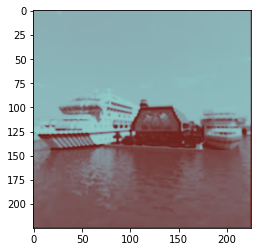

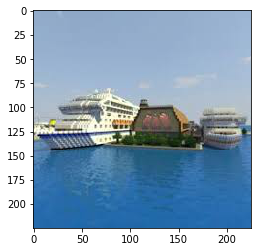

(9, 50625)
[[0.47938709 0.51180915 0.51194733 ... 0.47273207 0.47486268 0.45217782]
 [0.38715408 0.59374158 0.59468365 ... 0.40964972 0.42094817 0.29481359]
 [0.37007519 0.61332179 0.61407876 ... 0.36699726 0.377984   0.21864912]]
[[0.69019608 0.69019608 0.69019608 ... 0.53333333 0.54509804 0.5254902 ]
 [0.75294118 0.75294118 0.75294118 ... 0.61568627 0.62745098 0.60784314]
 [0.80392157 0.80392157 0.80392157 ... 0.69019608 0.70196078 0.68235294]]


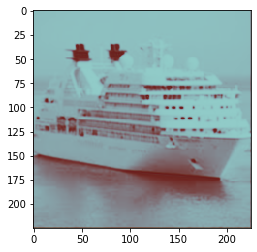

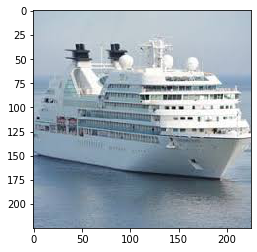

(9, 50625)
[[0.4607526  0.48756729 0.48786575 ... 0.41784544 0.41729398 0.41890796]
 [0.27374897 0.4322359  0.43419688 ... 0.16204753 0.16387971 0.23946354]
 [0.2394703  0.43657529 0.43909108 ... 0.12534688 0.12588717 0.18048501]]
[[0.46666667 0.46666667 0.47058824 ... 0.19607843 0.2        0.2       ]
 [0.59215686 0.59215686 0.59607843 ... 0.28235294 0.28627451 0.29019608]
 [0.79215686 0.79215686 0.79607843 ... 0.33333333 0.32941176 0.32156863]]


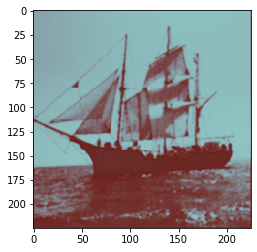

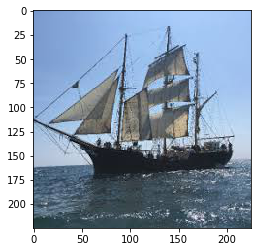

(9, 50625)
[[0.47870715 0.51099509 0.51099509 ... 0.44617877 0.44770676 0.43906029]
 [0.3825745  0.58879834 0.58879834 ... 0.24850009 0.26453072 0.23221543]
 [0.36467252 0.60839652 0.60839652 ... 0.20231282 0.22356527 0.16677892]]
[[0.61960784 0.61960784 0.61960784 ... 0.28627451 0.34509804 0.32156863]
 [0.75294118 0.75294118 0.75294118 ... 0.44313725 0.49019608 0.47843137]
 [0.92941176 0.92941176 0.92941176 ... 0.54117647 0.59215686 0.57647059]]


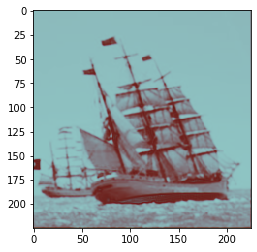

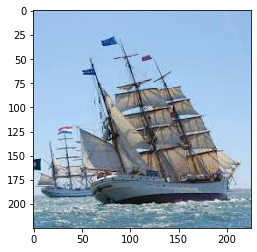

(9, 50625)
[[0.50623519 0.53988696 0.53988696 ... 0.53111507 0.53111507 0.49915956]
 [0.56855025 0.73208895 0.73208895 ... 0.71435719 0.71435719 0.57097609]
 [0.57766772 0.73658527 0.73658527 ... 0.69955692 0.69955692 0.51322988]]
[[1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]]


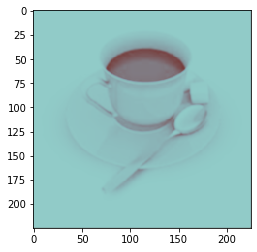

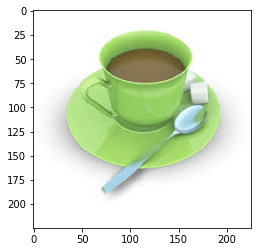

(9, 50625)
[[0.43174076 0.44104807 0.44104807 ... 0.42484833 0.42079939 0.41892117]
 [0.20652984 0.18656339 0.18656339 ... 0.17001863 0.15774501 0.21111301]
 [0.17419464 0.15230894 0.15230894 ... 0.13113199 0.12215497 0.16089616]]
[[0.04705882 0.04705882 0.04705882 ... 0.16078431 0.11372549 0.0627451 ]
 [0.34901961 0.34901961 0.34901961 ... 0.32941176 0.28235294 0.2627451 ]
 [0.52941176 0.52941176 0.52941176 ... 0.40392157 0.35686275 0.3372549 ]]


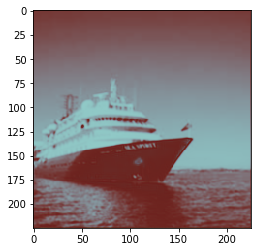

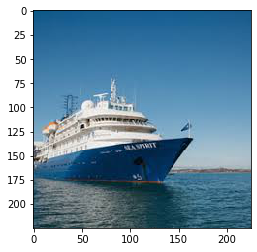

(9, 50625)
[[0.4218871  0.42846182 0.42762397 ... 0.40942071 0.41032644 0.41508119]
 [0.27128535 0.19893601 0.18545139 ... 0.18328721 0.18110562 0.28330398]
 [0.25760969 0.15595777 0.15426132 ... 0.14897571 0.14584559 0.24232151]]
[[0.34901961 0.29019608 0.2745098  ... 0.29019608 0.28235294 0.26666667]
 [0.21960784 0.16078431 0.14509804 ... 0.17254902 0.16470588 0.15686275]
 [0.15294118 0.09411765 0.07843137 ... 0.13333333 0.13333333 0.10980392]]


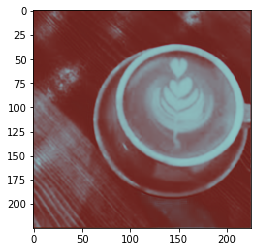

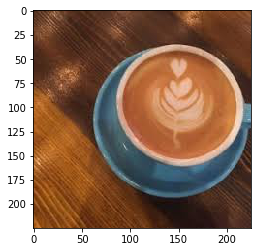

(9, 50625)
[[0.42108247 0.42361861 0.42371104 ... 0.41841633 0.41886641 0.42012583]
 [0.30107843 0.21671031 0.2154858  ... 0.16448428 0.1652233  0.22995962]
 [0.30349768 0.188911   0.18665188 ... 0.12658702 0.12695948 0.17100927]]
[[0.29411765 0.29803922 0.29803922 ... 0.45490196 0.45882353 0.4745098 ]
 [0.12156863 0.1254902  0.1254902  ... 0.24313725 0.24705882 0.25490196]
 [0.07843137 0.08235294 0.08235294 ... 0.14117647 0.14509804 0.15686275]]


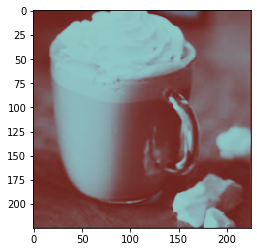

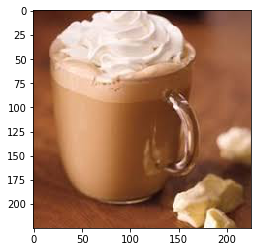

(9, 50625)
[[0.41974541 0.42208034 0.42206729 ... 0.40971249 0.40773379 0.41311162]
 [0.32471071 0.23677684 0.23279841 ... 0.31008656 0.30906381 0.43820135]
 [0.33763847 0.21272451 0.20863382 ... 0.31253836 0.31568755 0.46972272]]
[[0.30980392 0.30980392 0.30980392 ... 0.12156863 0.12156863 0.14117647]
 [0.09411765 0.09411765 0.09411765 ... 0.08627451 0.08627451 0.09019608]
 [0.11372549 0.11372549 0.11372549 ... 0.02745098 0.02745098 0.02745098]]


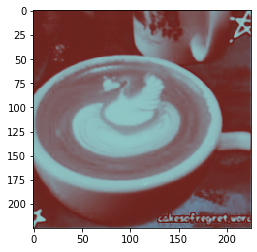

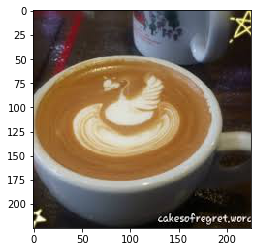

(9, 50625)
[[0.41876094 0.4202933  0.42031119 ... 0.40974416 0.40884879 0.41480948]
 [0.35305746 0.26367712 0.26671896 ... 0.18383968 0.18526417 0.29353116]
 [0.37911676 0.24906798 0.2530746  ... 0.14674859 0.15417468 0.25742691]]
[[0.17647059 0.17647059 0.17647059 ... 0.21568627 0.23137255 0.23137255]
 [0.10980392 0.10980392 0.10980392 ... 0.15294118 0.16078431 0.17647059]
 [0.07843137 0.07843137 0.07843137 ... 0.10196078 0.10588235 0.1254902 ]]


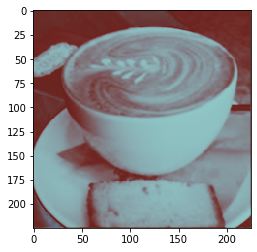

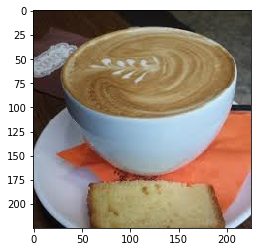

(9, 50625)
[[0.50514984 0.53899727 0.53921687 ... 0.52954491 0.52954491 0.49747857]
 [0.56181202 0.72869    0.72961385 ... 0.70983008 0.70983008 0.56391107]
 [0.57022562 0.73389209 0.73454364 ... 0.69449378 0.69449378 0.5047332 ]]
[[1.         1.         1.         ... 0.99607843 0.99607843 0.99607843]
 [0.98431373 0.98823529 0.98823529 ... 0.99607843 0.99607843 0.99607843]
 [0.98431373 0.98431373 0.99215686 ... 0.99607843 0.99607843 0.99607843]]


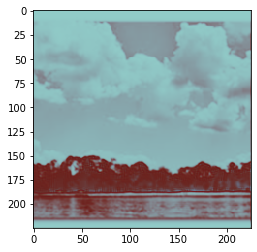

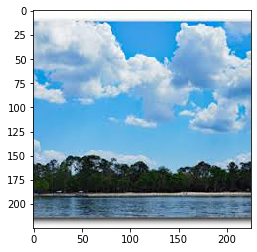

(9, 50625)
[[0.44438206 0.47396201 0.48885639 ... 0.41237618 0.41124016 0.41510072]
 [0.21659814 0.38031589 0.49358187 ... 0.17686965 0.19454223 0.32563978]
 [0.17084645 0.35953452 0.4749999  ... 0.13847722 0.15628175 0.27903914]]
[[0.36470588 0.54901961 0.61568627 ... 0.24313725 0.26666667 0.23921569]
 [0.44705882 0.63137255 0.69019608 ... 0.17647059 0.20392157 0.17647059]
 [0.51372549 0.69803922 0.74901961 ... 0.11372549 0.14117647 0.11372549]]


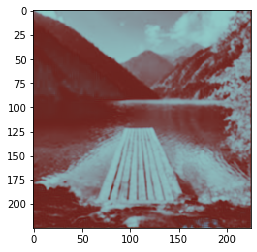

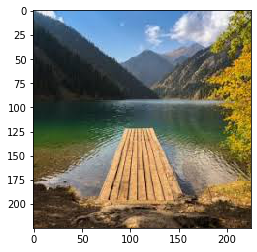

(9, 50625)
[[0.42278104 0.43244702 0.43892005 ... 0.42259073 0.41774351 0.41946468]
 [0.23878153 0.21225996 0.23302024 ... 0.16967885 0.17049381 0.23205146]
 [0.20880022 0.15336507 0.16973874 ... 0.12545706 0.12989824 0.17142781]]
[[0.24313725 0.27058824 0.34509804 ... 0.20392157 0.21176471 0.17254902]
 [0.37647059 0.40392157 0.47843137 ... 0.30196078 0.30980392 0.28627451]
 [0.27843137 0.29803922 0.37254902 ... 0.31764706 0.3254902  0.30980392]]


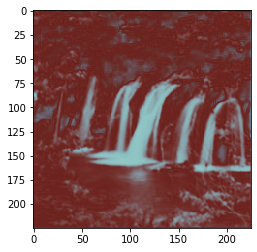

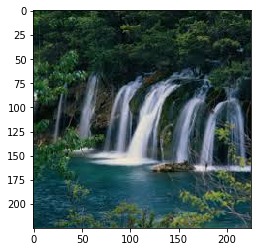

(9, 50625)
[[0.44390448 0.46139858 0.46138834 ... 0.409275   0.40907705 0.41255983]
 [0.20858257 0.26465568 0.26418621 ... 0.41382965 0.39458123 0.46475328]
 [0.17180333 0.23834437 0.2378586  ... 0.45927769 0.44420439 0.51581022]]
[[0.43137255 0.43137255 0.43529412 ... 0.03921569 0.0627451  0.06666667]
 [0.43137255 0.43137255 0.42745098 ... 0.04705882 0.07058824 0.0745098 ]
 [0.32156863 0.32941176 0.32941176 ... 0.         0.01960784 0.03137255]]


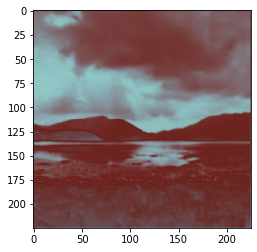

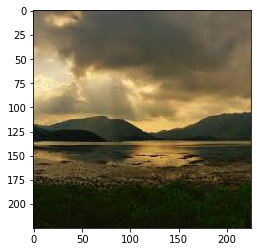

(9, 50625)
[[0.47808441 0.5090016  0.50627639 ... 0.42047228 0.4214089  0.42159525]
 [0.38141925 0.57790984 0.56156504 ... 0.15775923 0.1563505  0.21482002]
 [0.36360453 0.59762545 0.58071609 ... 0.12377944 0.1233236  0.1644677 ]]
[[0.78823529 0.78823529 0.79215686 ... 0.45490196 0.44705882 0.53333333]
 [0.7372549  0.71764706 0.69019608 ... 0.22352941 0.21568627 0.29803922]
 [0.71372549 0.70980392 0.70196078 ... 0.09019608 0.08235294 0.16470588]]


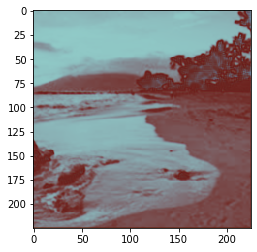

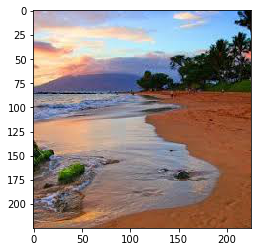

(9, 50625)
[[0.43157886 0.43841723 0.43212403 ... 0.46718572 0.46657664 0.44880437]
 [0.20643015 0.17359541 0.16998868 ... 0.37239408 0.36480271 0.27349979]
 [0.1765516  0.14766431 0.1465791  ... 0.3229999  0.3230448  0.20286913]]
[[0.24313725 0.23137255 0.17254902 ... 0.72941176 0.72156863 0.7254902 ]
 [0.25490196 0.24313725 0.19215686 ... 0.5254902  0.50980392 0.5254902 ]
 [0.21176471 0.2        0.16470588 ... 0.34117647 0.32941176 0.34117647]]


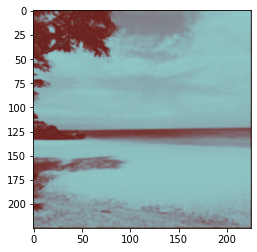

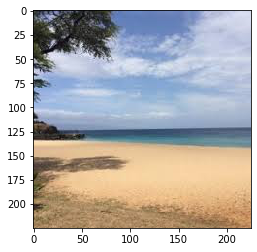

(9, 50625)
[[0.43502794 0.44025894 0.44006197 ... 0.48228187 0.48171408 0.456325  ]
 [0.22212279 0.18509517 0.18492291 ... 0.45412519 0.45718915 0.31602631]
 [0.19209304 0.14734117 0.1484607  ... 0.41871372 0.41939108 0.23977311]]
[[0.20392157 0.10588235 0.11764706 ... 0.8        0.83137255 0.83921569]
 [0.41960784 0.32156863 0.33333333 ... 0.56862745 0.6        0.59607843]
 [0.43137255 0.33333333 0.34509804 ... 0.40392157 0.43529412 0.43529412]]


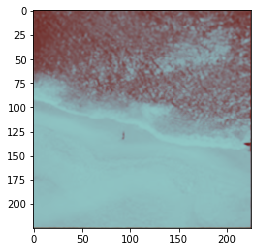

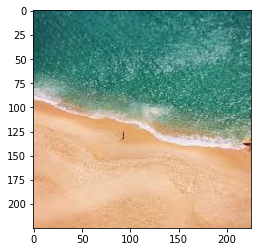

(9, 50625)
[[0.49745332 0.53148765 0.53148765 ... 0.45990562 0.45836253 0.44111944]
 [0.51046443 0.69713388 0.69713388 ... 0.32832181 0.31487571 0.24627285]
 [0.51389358 0.70828441 0.70828441 ... 0.27798934 0.26649923 0.17932781]]
[[0.86666667 0.86666667 0.86666667 ... 0.52156863 0.47843137 0.50196078]
 [0.91372549 0.91372549 0.91372549 ... 0.56862745 0.5254902  0.54901961]
 [0.97647059 0.97647059 0.97647059 ... 0.12941176 0.08627451 0.10980392]]


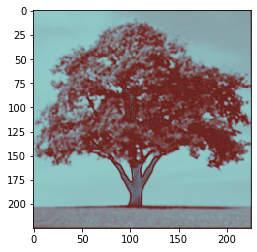

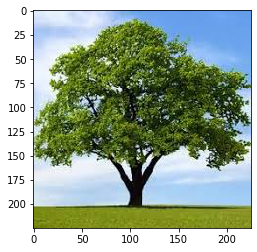

(9, 50625)
[[0.45661816 0.47913733 0.47618036 ... 0.42251303 0.42422791 0.42396153]
 [0.2577104  0.37814493 0.35977503 ... 0.17799666 0.18438375 0.22447702]
 [0.22278166 0.37201118 0.34825879 ... 0.13458608 0.14089815 0.15887006]]
[[0.45098039 0.42745098 0.40784314 ... 0.33333333 0.35294118 0.34117647]
 [0.58431373 0.56078431 0.54117647 ... 0.34117647 0.37254902 0.36078431]
 [0.69019608 0.66666667 0.64705882 ... 0.18431373 0.21568627 0.2       ]]


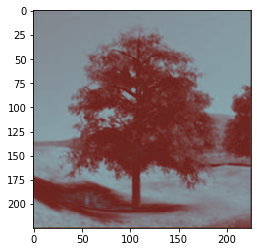

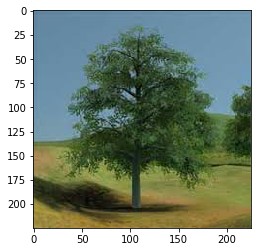

(9, 50625)
[[0.49319098 0.52882552 0.52893524 ... 0.43689364 0.43627946 0.42957628]
 [0.51339239 0.69849601 0.69902401 ... 0.22152344 0.22002462 0.2164637 ]
 [0.50953456 0.70430737 0.70467935 ... 0.17254676 0.17274558 0.15117557]]
[[0.97647059 0.97647059 0.97647059 ... 0.41568627 0.42352941 0.38039216]
 [0.97647059 0.97647059 0.97647059 ... 0.41176471 0.41960784 0.38039216]
 [0.96862745 0.96862745 0.96862745 ... 0.39607843 0.40392157 0.37254902]]


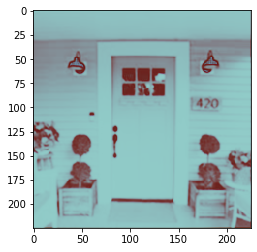

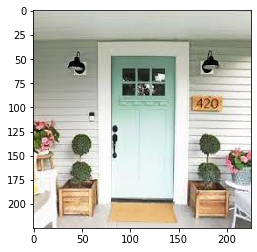

(9, 50625)
[[0.4315673  0.44075415 0.44075415 ... 0.4667637  0.46883967 0.44867023]
 [0.20700382 0.18596482 0.18596482 ... 0.36888683 0.38033864 0.27589126]
 [0.17481189 0.15169271 0.15169271 ... 0.32366101 0.33597075 0.203205  ]]
[[0.12941176 0.12941176 0.12941176 ... 0.53333333 0.54509804 0.55294118]
 [0.31764706 0.31764706 0.31764706 ... 0.55686275 0.56862745 0.56078431]
 [0.57647059 0.57647059 0.57647059 ... 0.61960784 0.63137255 0.60784314]]


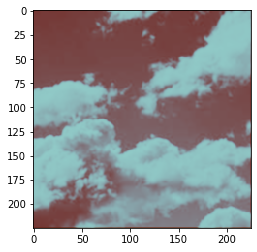

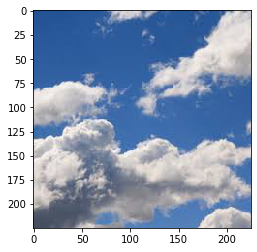

(9, 50625)
[[0.50408632 0.53803058 0.53849795 ... 0.48891039 0.48606176 0.46032536]
 [0.55846011 0.72543426 0.72530813 ... 0.48935911 0.45887065 0.31044989]
 [0.56581457 0.73085853 0.73094694 ... 0.46264127 0.43389769 0.24077611]]
[[0.98431373 1.         0.94901961 ... 0.59607843 0.52156863 0.5254902 ]
 [1.         1.         0.96078431 ... 0.68627451 0.61568627 0.62745098]
 [0.90196078 0.9254902  0.87843137 ... 0.36470588 0.28627451 0.27058824]]


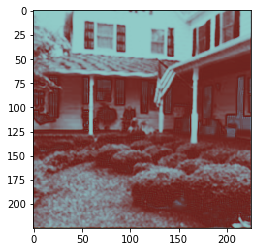

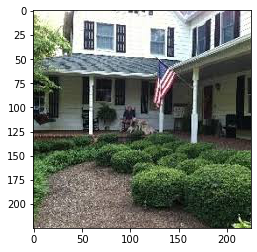

(9, 50625)
[[0.43333168 0.43964508 0.42562603 ... 0.48685976 0.49059753 0.465381  ]
 [0.19449937 0.18839    0.1515793  ... 0.50355872 0.51769053 0.3752776 ]
 [0.16240685 0.16845395 0.12320773 ... 0.47022965 0.48738835 0.29954338]]
[[0.24705882 0.27843137 0.10980392 ... 0.74509804 0.71372549 0.78039216]
 [0.25490196 0.28627451 0.11764706 ... 0.75294118 0.7254902  0.78039216]
 [0.2        0.23137255 0.0627451  ... 0.25490196 0.21960784 0.29411765]]


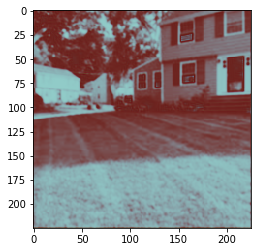

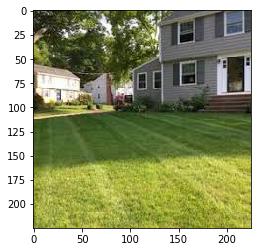

(9, 50625)
[[0.45714565 0.48004615 0.47567498 ... 0.48792746 0.48774469 0.46564856]
 [0.27058203 0.39926851 0.3697183  ... 0.48947106 0.50615327 0.38384927]
 [0.23506874 0.39142536 0.35269979 ... 0.45211667 0.47671201 0.30808796]]
[[0.75686275 0.74117647 0.70980392 ... 0.67843137 0.75294118 0.85098039]
 [0.56470588 0.54901961 0.51764706 ... 0.60784314 0.68235294 0.75686275]
 [0.50588235 0.49019608 0.45882353 ... 0.56078431 0.63529412 0.71764706]]


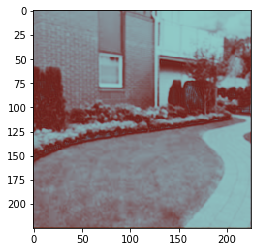

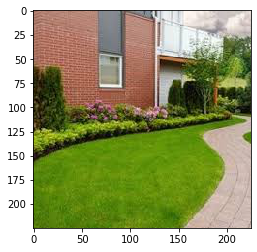

(9, 50625)
[[0.48026381 0.5125685  0.51225558 ... 0.46601052 0.46582795 0.44675771]
 [0.39072712 0.59649922 0.5949341  ... 0.3682736  0.36540286 0.27021486]
 [0.37497568 0.6168588  0.6153522  ... 0.31887635 0.31872674 0.19771991]]
[[0.78823529 0.78431373 0.78431373 ... 0.00784314 0.         0.        ]
 [0.7372549  0.73333333 0.73333333 ... 0.68627451 0.67843137 0.67843137]
 [0.70588235 0.69803922 0.69803922 ... 0.95686275 0.94901961 0.94509804]]


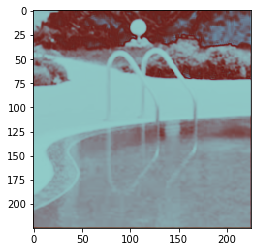

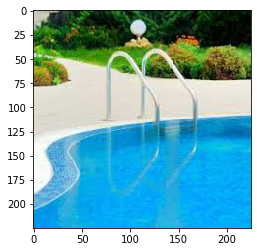

(9, 50625)
[[0.45125252 0.47300183 0.47316325 ... 0.47906842 0.48110463 0.45474266]
 [0.22959084 0.33158799 0.3327637  ... 0.43921463 0.45396955 0.30761443]
 [0.19273685 0.31797127 0.31909593 ... 0.40412747 0.41316117 0.23095497]]
[[0.56862745 0.56862745 0.56862745 ... 0.69803922 0.72941176 0.68235294]
 [0.47843137 0.47843137 0.47843137 ... 0.58431373 0.61568627 0.60392157]
 [0.35686275 0.35686275 0.35686275 ... 0.59215686 0.63137255 0.61176471]]


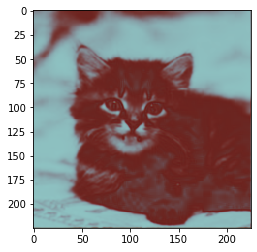

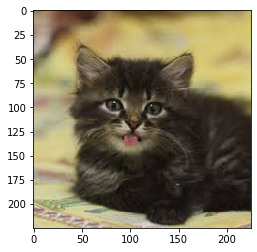

(9, 50625)
[[0.42288686 0.42090643 0.41897625 ... 0.44266532 0.44348794 0.43315034]
 [0.33005264 0.24063674 0.25368704 ... 0.24721039 0.24113951 0.24417244]
 [0.34534321 0.23002001 0.23972146 ... 0.19605094 0.1886671  0.18388113]]
[[0.22745098 0.20784314 0.20392157 ... 0.54901961 0.45882353 0.63921569]
 [0.11372549 0.09411765 0.09803922 ... 0.45098039 0.36078431 0.54117647]
 [0.08235294 0.0627451  0.0627451  ... 0.33333333 0.24313725 0.42352941]]


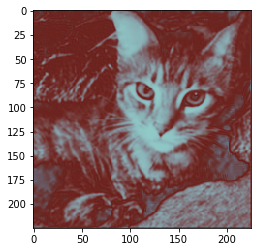

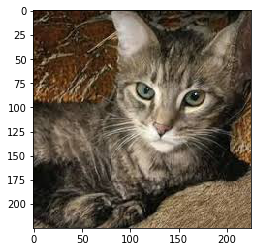

(9, 50625)
[[0.47674011 0.45035843 0.43001309 ... 0.43633491 0.43638639 0.42889635]
 [0.355586   0.20535646 0.19293779 ... 0.22038767 0.22052907 0.22255969]
 [0.38967207 0.18201517 0.1585511  ... 0.1709292  0.17092308 0.15647236]]
[[0.95294118 0.10980392 0.23529412 ... 0.40784314 0.40784314 0.40392157]
 [0.96470588 0.12156863 0.24705882 ... 0.41176471 0.41176471 0.40784314]
 [0.98431373 0.14117647 0.26666667 ... 0.41960784 0.41960784 0.41568627]]


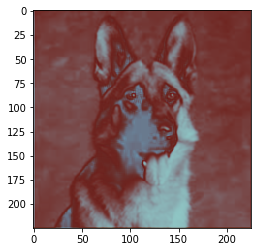

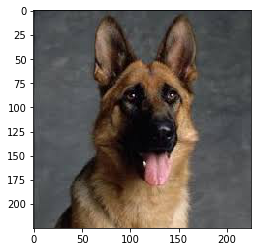

(9, 50625)
[[0.46978677 0.49971555 0.49977904 ... 0.46647374 0.46861765 0.44858994]
 [0.32403309 0.51526076 0.51590384 ... 0.36361807 0.37507769 0.27479603]
 [0.29643403 0.5316546  0.53225573 ... 0.3194973  0.33146646 0.20374896]]
[[0.8        0.8        0.8        ... 0.70980392 0.7254902  0.72941176]
 [0.63529412 0.63529412 0.63529412 ... 0.51372549 0.51764706 0.53333333]
 [0.43921569 0.43921569 0.43921569 ... 0.38431373 0.38431373 0.38823529]]


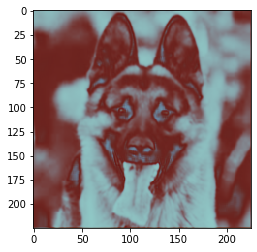

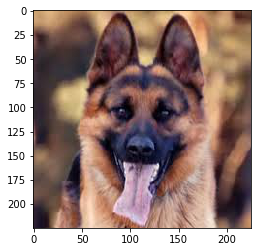

(9, 50625)
[[0.43629621 0.4492785  0.44986868 ... 0.40441237 0.40486338 0.41195997]
 [0.19984279 0.2105895  0.21277    ... 0.1835329  0.18826286 0.29906673]
 [0.16473563 0.17740508 0.17980015 ... 0.18331598 0.18900754 0.31513869]]
[[0.40784314 0.41176471 0.41568627 ... 0.02352941 0.02352941 0.02352941]
 [0.34117647 0.34509804 0.34901961 ... 0.06666667 0.06666667 0.0627451 ]
 [0.23921569 0.24313725 0.24705882 ... 0.00392157 0.00392157 0.01960784]]


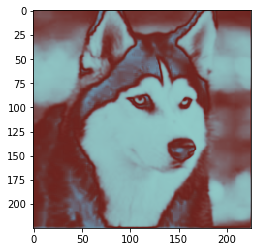

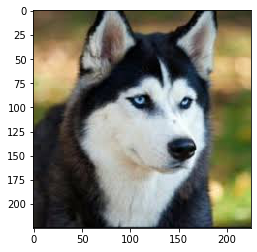

(9, 50625)
[[0.4293705  0.42767537 0.42340186 ... 0.50822077 0.51927578 0.49153671]
 [0.23259327 0.19257424 0.19123332 ... 0.61192594 0.66576947 0.53487847]
 [0.21053931 0.17255006 0.15062031 ... 0.59969177 0.65022703 0.47526922]]
[[0.22352941 0.27843137 0.19607843 ... 0.78431373 0.88627451 0.97254902]
 [0.18431373 0.23921569 0.15686275 ... 0.79607843 0.89803922 0.98823529]
 [0.14901961 0.20392157 0.11764706 ... 0.81568627 0.91764706 0.99215686]]


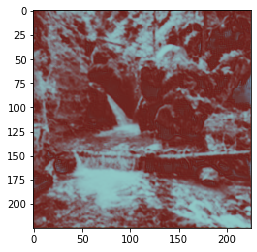

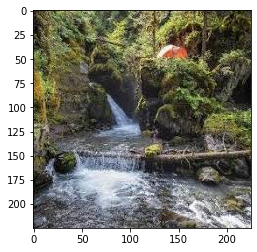

(9, 50625)
[[0.44480976 0.4627617  0.46270428 ... 0.41693837 0.41707862 0.4189736 ]
 [0.21160001 0.27392508 0.27347217 ... 0.1633198  0.16327093 0.23608641]
 [0.17467837 0.2483384  0.24744319 ... 0.12578927 0.12546426 0.17865355]]
[[0.77647059 0.77647059 0.77647059 ... 0.38823529 0.39215686 0.39215686]
 [0.35686275 0.35686275 0.35686275 ... 0.23921569 0.23529412 0.24705882]
 [0.23137255 0.23137255 0.23137255 ... 0.20392157 0.20392157 0.21176471]]


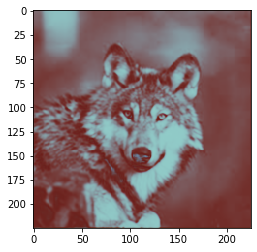

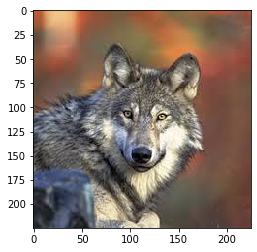

(9, 50625)
[[0.44629524 0.46552526 0.46585757 ... 0.4358294  0.4347327  0.4279012 ]
 [0.21497129 0.28821185 0.29005712 ... 0.21866824 0.21535029 0.22401827]
 [0.17787326 0.2651355  0.26748157 ... 0.16834227 0.16559859 0.15712832]]
[[0.31372549 0.31372549 0.31764706 ... 0.31372549 0.30980392 0.30588235]
 [0.48235294 0.48235294 0.48627451 ... 0.43137255 0.42745098 0.42352941]
 [0.50588235 0.50588235 0.50980392 ... 0.4627451  0.45882353 0.45490196]]


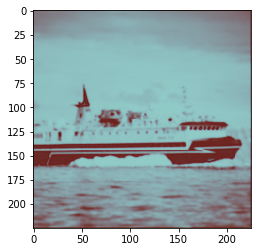

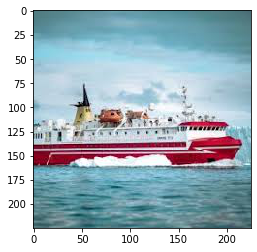

(9, 50625)
[[0.45146687 0.47346075 0.47283816 ... 0.42437381 0.42578348 0.42384315]
 [0.23197844 0.33665305 0.33298312 ... 0.17606183 0.177906   0.2155683 ]
 [0.19492865 0.32306886 0.31906578 ... 0.13568985 0.13741605 0.15677734]]
[[0.57647059 0.57647059 0.57647059 ... 0.37647059 0.37647059 0.39607843]
 [0.48627451 0.48627451 0.48627451 ... 0.31764706 0.31764706 0.3372549 ]
 [0.36470588 0.36470588 0.36470588 ... 0.24313725 0.24313725 0.2627451 ]]


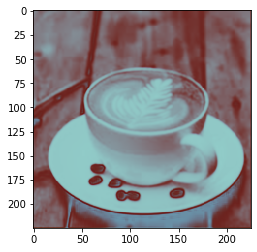

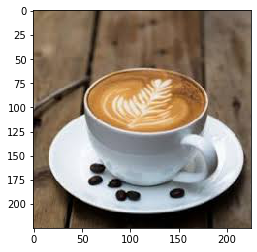

(9, 50625)
[[0.45190027 0.47360707 0.47190864 ... 0.40787852 0.40925819 0.41229612]
 [0.23909558 0.34346675 0.33263076 ... 0.34399532 0.35490384 0.436736  ]
 [0.2020475  0.32843888 0.31519349 ... 0.36767177 0.37760228 0.48538214]]
[[0.3372549  0.3254902  0.32156863 ... 0.11372549 0.09411765 0.08235294]
 [0.55294118 0.54117647 0.52941176 ... 0.07058824 0.05098039 0.03529412]
 [0.77254902 0.76078431 0.74117647 ... 0.1254902  0.10588235 0.0745098 ]]


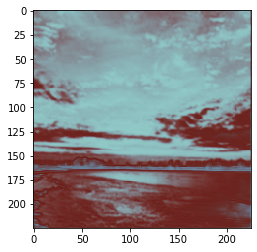

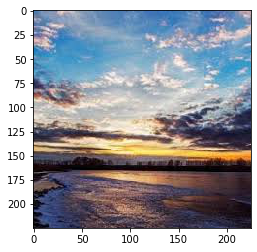

In [0]:
if __name__ == "__main__":
    import os

    THIS_FOLDER = os.path.dirname("D:/Rushabh/MS/College/Sem 1/520 - Intro to AI/Projects/Colorizer/NN.ipynb")
    # print(THIS_FOLDER)
    my_file = os.path.join(THIS_FOLDER, 'Google data')
    images = get_data(my_file)

    (x_train, y_train), (test_data, test_output) = split_data(images, 3)
    for i in range(len(x_train)):
        x_train[i] = np.asarray(x_train[i])/255.0
        for k in range(3):
            y_train[k][i] = np.asarray(y_train[k][i])/255.0
  
    
    num_hidden = 2
    epochs = 100
    batch_epochs = 1
    learning_rate = 1
    num_nodes_layer = [16, 4]
    activation_function = "sigmoid"
    batch_size = 1
    rednn = NeuralNetwork(x_train, list(y_train)[0], num_hidden = num_hidden, epochs = epochs, batch_epochs = batch_epochs, learning_rate = learning_rate, num_nodes_layers = num_nodes_layer,
                       activation_function = activation_function, batch_size = batch_size)
    greennn = NeuralNetwork(x_train, list(y_train)[1], num_hidden = num_hidden, epochs = epochs, batch_epochs = batch_epochs, learning_rate = learning_rate, num_nodes_layers = num_nodes_layer,
                       activation_function = activation_function, batch_size = batch_size)
    bluenn = NeuralNetwork(x_train, list(y_train)[2], num_hidden = num_hidden, epochs = epochs, batch_epochs = batch_epochs, learning_rate = learning_rate, num_nodes_layers = num_nodes_layer,
                       activation_function = activation_function, batch_size = batch_size)
    rednn.model()
    greennn.model()
    bluenn.model()
    
    count = 1
    for test_img, test_out_0, test_out_1, test_out_2 in zip(test_data, test_output[0], test_output[1], test_output[2]):
        test_img = test_img/255.0
        test_out_0 = np.asarray(test_out_0)/255.0
        test_out_1 = np.asarray(test_out_1)/255.0
        test_out_2 = np.asarray(test_out_2)/255.0

        print(test_img.shape)
        prediction = []
        prediction.append(rednn.predict(test_img))
        prediction.append(greennn.predict(test_img))
        prediction.append(bluenn.predict(test_img))
        prediction = np.reshape(np.array(prediction), (np.array(prediction).shape[0], np.array(prediction).shape[2]))
        print(prediction)
        img = convert_output_image(prediction, images[-1].shape)
        plt.figure()
        plt.imshow(img)
        plt.imsave("D:/Rushabh/MS/College/Sem 1/520 - Intro to AI/Projects/Colorizer/CNN_rgb_out/Colored_" + str(count) + ".jpg", img)

        # # Actual Image
        original = []
        original.append(test_out_0)
        original.append(test_out_1)
        original.append(test_out_2)
        original = np.array(original)
        print(original)
        img = convert_output_image(original, images[-1].shape)
        plt.figure()
        plt.imshow(img)
        plt.imsave("D:/Rushabh/MS/College/Sem 1/520 - Intro to AI/Projects/Colorizer/CNN_rgb_out/Original_" + str(count) + ".jpg", img)
        plt.show()
        count += 1